## 1. Data Loading

In [11]:
from utils_NB import *
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import seaborn as sns

df_processed = pd.read_csv(PROCESSED_DATA_DIR/'processed_data.csv')


### 1.1 Checking Data's Information

In [12]:
df_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35063 entries, 0 to 35062
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   timestamp                    35063 non-null  object 
 1   DA_Price                     35063 non-null  float64
 2   actual_load                  35063 non-null  float64
 3   forecast_load                35063 non-null  float64
 4   solar_generation             35063 non-null  float64
 5   wind_on_generation           35063 non-null  float64
 6   wind_off_generation          35063 non-null  float64
 7   fossil_hard_coal_generation  35063 non-null  float64
 8   fossil_gas_generation        35063 non-null  float64
dtypes: float64(8), object(1)
memory usage: 2.4+ MB


In [13]:
df_processed.isna().sum()

timestamp                      0
DA_Price                       0
actual_load                    0
forecast_load                  0
solar_generation               0
wind_on_generation             0
wind_off_generation            0
fossil_hard_coal_generation    0
fossil_gas_generation          0
dtype: int64

In [14]:
df_processed.describe()

,DA_Price,actual_load,forecast_load,solar_generation,wind_on_generation,wind_off_generation,fossil_hard_coal_generation,fossil_gas_generation
count,35063.000000,35063.000000,35063.000000,35063.000000,35063.000000,35063.000000,35063.000000,35063.000000
mean,129.464562,49198.702944,45534.588558,222.425568,3155.471313,4838.200636,7096.875109,15716.822205
std,105.976909,7988.672943,8910.049298,352.335846,2581.770777,4050.832283,4518.803376,9835.099408
min,-500.000000,21532.740000,1915.080000,0.000000,16.390000,0.000000,0.000000,2246.750000
25%,67.460000,43244.400000,40946.760000,0.000000,989.425000,1330.990000,3110.715000,7292.245000
50%,99.900000,48243.000000,45552.110000,6.940000,2343.480000,3827.070000,7014.160000,12974.760000
75%,163.975000,54293.835000,50877.330000,337.455000,4842.645000,7814.540000,11027.600000,22995.960000
max,872.960000,85857.350000,85027.690000,1710.810000,14647.780000,17371.930000,15613.910000,44795.090000


In [15]:
ddf = df_processed.copy()
ddf[ddf.duplicated('timestamp')]

,timestamp,DA_Price,actual_load,forecast_load,solar_generation,wind_on_generation,wind_off_generation,fossil_hard_coal_generation,fossil_gas_generation
16009,2022-10-30 02,99.92,73745.97,79401.80,7.12,6510.80,4356.02,6414.54,43279.71
24745,2023-10-29 02,-1.59,85857.35,76350.72,0.00,14647.78,16854.90,7441.07,6088.52
33481,2024-10-27 02,80.43,82364.79,82413.32,0.44,2029.08,4515.84,10087.77,11860.07


In [16]:
df_processed.loc[
    (df_processed['timestamp'] == '2022-10-30 02')
]

,timestamp,DA_Price,actual_load,forecast_load,solar_generation,wind_on_generation,wind_off_generation,fossil_hard_coal_generation,fossil_gas_generation
16008,2022-10-30 02,100.21,73745.97,79401.8,7.12,6510.8,4356.02,6414.54,43279.71
16009,2022-10-30 02,99.92,73745.97,79401.8,7.12,6510.8,4356.02,6414.54,43279.71


## 2. Visualizing Data

In [18]:
fig = make_subplots(rows=8, cols=1)

fig.add_trace(go.Scatter(
    x=df_processed['timestamp'],
    y=df_processed['DA_Price'],
    name='DA_Price',
    #xaxis_title='Time',
    #yaxis_title='Price [Eur/MWh]'
    ),
    row=1,
    col=1
)

fig.add_trace(go.Scatter(
    x=df_processed['timestamp'],
    y=df_processed['actual_load'],
    name='Actual_load',
    #xaxis_title='Time',
    #yaxis_title='Load [MW]'
    ),
    row=2,
    col=1
)

fig.add_trace(go.Scatter(
    x=df_processed['timestamp'],
    y=df_processed['solar_generation'],
    name='Solar_generation',
    #xaxis_title='Time',
    #yaxis_title='Load [MW]'
    ),
    row=3,
    col=1
)

fig.add_trace(go.Scatter(
    x=df_processed['timestamp'],
    y=df_processed['wind_on_generation'],
    name='wind_onshore_generation',
    #xaxis_title='Time',
    #yaxis_title='Load [MW]'
    ),
    row=4,
    col=1
)

fig.add_trace(go.Scatter(
    x=df_processed['timestamp'],
    y=df_processed['wind_off_generation'],
    name='wind_offshore_generation',
    #xaxis_title='Time',
    #yaxis_title='Load [MW]'
    ),
    row=5,
    col=1
)

fig.add_trace(go.Scatter(
    x=df_processed['timestamp'],
    y=df_processed['forecast_load'],
    name='Forecast_load',
    #xaxis_title='Time',
    #yaxis_title='Load [MW]'
    ),
    row=6,
    col=1
)

fig.add_trace(go.Scatter(
    x=df_processed['timestamp'],
    y=df_processed['fossil_hard_coal_generation'],
    name='fossil_hard_coal_generation',
    #xaxis_title='Time',
    #yaxis_title='Load [MW]'
    ),
    row=7,
    col=1
)


fig.add_trace(go.Scatter(
    x=df_processed['timestamp'],
    y=df_processed['fossil_gas_generation'],
    name='fossil_gas_generation',
    #xaxis_title='Time',
    #yaxis_title='Load [MW]'
    ),
    row=8,
    col=1
)


fig.update_layout(
    height=1200,
    width=1000
)

fig.update_xaxes(title='Time [hr]')

fig.update_yaxes(
    title_text='Price [Eur/MWh]',
    row=1,
    col=1
)

for i in range(2,9):
    fig.update_yaxes(
        title_text='Load [MW]',
        row=i,
        col=1
    )

fig.show()

In [19]:
fig_area = go.Figure()

fig_area.add_trace(go.Scatter(
    x=df_processed['timestamp'], 
    y=df_processed['actual_load'],
    mode='lines',
    name='Actual Load',
    stackgroup='one',
    groupnorm='percent'
))

fig_area.add_trace(go.Scatter(
    x=df_processed['timestamp'], 
    y=df_processed['forecast_load'],
    mode='lines',
    name='Forecast Load',
    stackgroup='one'
))

fig_area.add_trace(go.Scatter(
    x=df_processed['timestamp'], 
    y=df_processed['solar_generation'],
    mode='lines',
    name='Solar Generation',
    stackgroup='one'
))

fig_area.add_trace(go.Scatter(
    x=df_processed['timestamp'], 
    y=df_processed['wind_on_generation'],
    mode='lines',
    name='Wind Onshore Generation',
    stackgroup='one'
))

fig_area.add_trace(go.Scatter(
    x=df_processed['timestamp'], 
    y=df_processed['wind_off_generation'],
    mode='lines',
    name='Wind Offshore Generation',
    stackgroup='one'
))

fig_area.add_trace(go.Scatter(
    x=df_processed['timestamp'], 
    y=df_processed['fossil_hard_coal_generation'],
    mode='lines',
    name='Fossil Hard Coal Generation',
    stackgroup='one'
))

fig_area.add_trace(go.Scatter(
    x=df_processed['timestamp'], 
    y=df_processed['fossil_gas_generation'],
    mode='lines',
    name='Fossil Gas Generation',
    stackgroup='one'
))

fig_area.show()

### 2.1 Price Data Distribution

In [20]:
fig = px.histogram(df_processed, x='DA_Price', title='Price Distribution', marginal='box')

fig.update_layout(
    xaxis_title='DA Price [EUR/MWh]',
    yaxis_title='Frequency'
)

fig.show()

## 3. Understanding Correlation between each Data Variable

In [21]:
df_processed

,timestamp,DA_Price,actual_load,forecast_load,solar_generation,wind_on_generation,wind_off_generation,fossil_hard_coal_generation,fossil_gas_generation
0,2021-01-01 00,48.19,45252.55,48177.82,0.0,621.33,777.25,8489.00,17422.24
1,2021-01-01 01,44.68,43700.59,46955.04,0.0,699.52,853.56,7400.20,14728.02
2,2021-01-01 02,42.92,42307.28,46425.64,0.0,837.81,791.99,6129.73,11936.33
3,2021-01-01 03,40.39,41484.49,46709.42,0.0,951.52,903.55,4938.73,11572.30
4,2021-01-01 04,40.20,41680.83,47889.14,0.0,1082.32,875.81,5203.13,11448.52
...,...,...,...,...,...,...,...,...,...
35058,2024-12-31 19,70.56,60049.18,63103.15,0.0,9905.24,14843.57,1197.50,4903.88
35059,2024-12-31 20,59.90,56237.66,60866.66,0.0,10031.51,14871.62,1198.50,3891.08
35060,2024-12-31 21,18.20,53070.46,57818.33,0.0,10045.80,14978.18,1200.30,3728.03
35061,2024-12-31 22,9.06,50768.73,54357.03,0.0,9854.30,14747.66,1200.24,3694.35


In [2]:
if 'timestamp' in df_processed.columns:
    print('yup')

NameError: name 'df_processed' is not defined

In [22]:
df_processed = df_processed.set_index('timestamp')

correls = df_processed.corr()

heat_map = ff.create_annotated_heatmap(
    z=correls.values,
    y=list(correls.index),
    x=list(correls.columns),
    annotation_text=correls.round(2).values,
    showscale=True
)


heat_map.show()

### 3.1 Checking Autocorrelation

In [3]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf

#plot_acf(df_processed['DA_Price'], lags=730)
df_acf = acf(df_processed['DA_Price'], nlags=9000)

fig_acf = go.Figure(data=go.Scatter(
    x=np.arange(len(df_acf)),
    y=df_acf,
    name='ACF'
))

fig_acf.show()

In [4]:
from statsmodels.tsa.stattools import pacf

#plot_acf(df_processed['DA_Price'], lags=730)
df_pacf = pacf(df_processed['DA_Price'], nlags=300)

fig_pacf = go.Figure(data=go.Scatter(
    x=np.arange(len(df_pacf)),
    y=df_pacf,
    name='PACF'
))

fig_pacf.show()

In [9]:
df_acf[:24]

array([1.        , 0.97184671, 0.9246484 , 0.87097066, 0.82161126,
       0.78433545, 0.76191117, 0.75449124, 0.759857  , 0.77372734,
       0.78984581, 0.80228792, 0.80458149, 0.79534818, 0.77613422,
       0.7535169 , 0.73350599, 0.72188046, 0.72193719, 0.73629665,
       0.76395093, 0.80126193, 0.84109677, 0.87274741])

In [10]:
df_pacf[:24]

array([ 1.        ,  0.97187443, -0.35771246, -0.03040404,  0.10429943,
        0.15200594,  0.13384347,  0.13582988,  0.13098483,  0.10998995,
        0.06084737,  0.02646527, -0.04693651, -0.02717804, -0.02112531,
        0.05109465,  0.05908983,  0.09112172,  0.10289314,  0.1611496 ,
        0.17272658,  0.1868598 ,  0.15582349,  0.05564453])

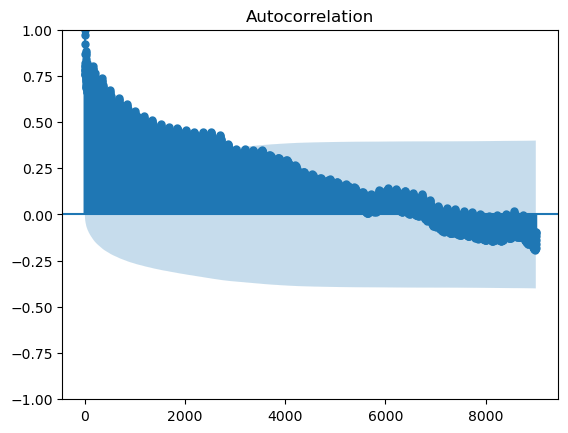

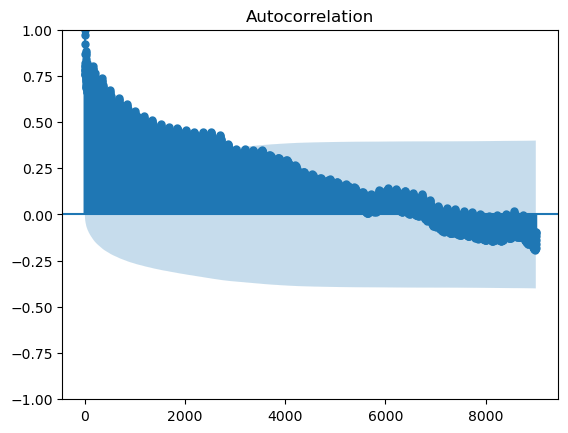

In [2]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(df_processed['DA_Price'], lags=9000)

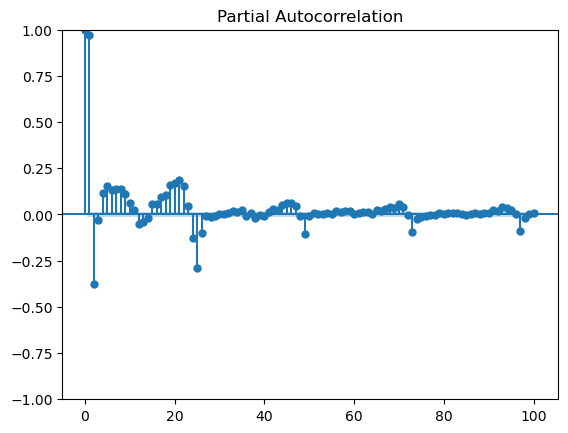

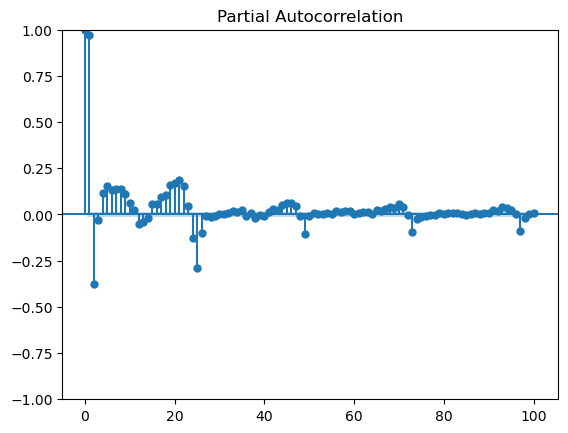

In [27]:
from statsmodels.graphics.tsaplots import plot_pacf

plot_pacf(df_processed['DA_Price'], lags=100)


### 3.2 Stationarity Test

In [36]:
from statsmodels.tsa.stattools import adfuller


y = df_processed['DA_Price']
result = adfuller(y, autolag='AIC')

adf_statistic = result[0]
p_value       = result[1]
n_lags        = result[2]
n_obs         = result[3]
crit_values   = result[4]

print("ADF statistic:", adf_statistic)
print("p-value:", p_value)
print("Used lags:", n_lags)
print("Number of observations:", n_obs)
print("Critical values:")
for level, cv in crit_values.items():
    print(f"  {level}: {cv}")

ADF statistic: -6.874920817691461
p-value: 1.4829969972304418e-09
Used lags: 49
Number of observations: 35013
Critical values:
  1%: -3.4305367814665044
  5%: -2.8616225527935106
  10%: -2.566813940257257


In [39]:
y_diff = y.diff().dropna()
adf_diff = adfuller(y_diff, autolag="AIC")
print("p-value after differencing:", adf_diff[1])


p-value after differencing: 0.0


In [ ]:
import matplotlib.pyplot as plt

rolling_mean = df_processed['DA_Price'].rolling(window=12).mean()
rolling_std = df_processed['DA_Price'].rolling(window=12).std()

plt.plot(df_processed['DA_Price'], label='Original')
plt.plot(rolling_mean, label='Rolling Mean')
plt.plot(rolling_std, label='Rolling Std')
plt.legend()
plt.title('Rolling Statistics')
plt.show()